<a href="https://colab.research.google.com/github/hadar23/Address-Book/blob/master/final2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

IMPORT

In [0]:
import numpy as np
import pandas as pd
import os
import sys
import seaborn as sn
import cv2
import glob
# from wcmatch import glob as gb
import torch.nn.functional as F
import torch.nn as nn
from torch.utils.data import Dataset,DataLoader
import torch
import random
# import torch_optimizer as optim
from torchvision import transforms
from matplotlib import pyplot as plt
from imgaug import augmenters as iaa
from  sklearn.model_selection import train_test_split
from  sklearn.metrics import confusion_matrix
# import pretrainedmodels
from tqdm.notebook import tqdm
import requests
from pydrive.auth import GoogleAuth
from pydrive.drive import GoogleDrive
from google.colab import drive
# from google.colab import auth
from oauth2client.client import GoogleCredentials

/usr/local/lib/python3.6/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


## albumentations

In [0]:
from albumentations import (
  HorizontalFlip, IAAPerspective, ShiftScaleRotate,VerticalFlip, CLAHE, RandomRotate90,Rotate,
    Transpose, ShiftScaleRotate, Blur,RandomGamma, OpticalDistortion, GridDistortion,HorizontalFlip, HueSaturationValue,
    IAAAdditiveGaussianNoise, GaussNoise, MotionBlur, MedianBlur, IAAPiecewiseAffine,
    IAASharpen, IAAEmboss, RandomBrightnessContrast, Flip, OneOf, Compose
)

In [0]:
# https://drive.google.com/drive/folders/1NUpRD3M3E5pIiZIuAMmuaDQokKX0NFEs
# "1NUpRD3M3E5pIiZIuAMmuaDQokKX0NFEs"

drive.mount('/content/gdrive')
# !ls '/content/gdrive/My Drive/ImagesCV/'


Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /content/gdrive


# list of all students dir

In [0]:
# list of all student dir

images_dir="/content/gdrive/My Drive/ImagesCV"
all_dir_name = [ f.path for f in os.scandir(images_dir) if f.is_dir() ]
# all_dir_name
len(all_dir_name)


27

# list of all students image

In [0]:
#list of all students image

all_image_per_student=[]
for basedir in all_dir_name:
     all_image_per_student.append([ f.path for f in os.scandir(basedir) ])
# all_image_per_student
len(all_image_per_student)



27

# list of all images


In [0]:
all_image=[]
for file in all_image_per_student:
      all_image+=(file)

len(all_image)
# all_image_paths

560

## student_map {name: index}

In [0]:

student_map={}
len(all_dir_name)
for i in range (len(all_dir_name)):
     student_map[all_dir_name[i].split("/")[-1]]=i+1


student_map['Almog_Amsalem']

10

### התמונות של כל הסטונדטים ביחס של 80 אחוז לאימון ו20  אחוז למבחן

In [0]:
train_paths,test_paths= train_test_split(all_image, test_size=0.2,random_state=2018)


In [0]:
# !ls '/content/gdrive/My Drive/ImagesCV/Hadar_Bonavida'
# all_image[0].split("/")[-2]

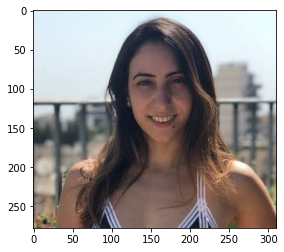

In [0]:
 
image = cv2.imread('/content/gdrive/My Drive/ImagesCV/Hadar_Bonavida/IMG-20180518-WA0036.jpg')
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
plt.imshow(image)

מתודה שמקבלת רשימת תמונות ורשימת תגיות ומציגה אותם


images - ליסט התמונות שצריך להציג.


tags - ליסט התגיות שצריך להציג


rows - מספר שורות.


cols - מספר עמודות.

In [0]:
def show_images_aug(images_list,tag_list,cols,rows):
#     images_list,tag_list=tup
    # plt.figure(figsize=[10, 20])
    # shape_factor = (4, 4)
    plt.figure(figsize=[cols*5, rows*5])

    #         assert len(image_list) == len(title_list), "Houston we've got a problem"
    for i in range(len(images_list)):
            image = images_list[i]
            plt.subplot(rows, cols, i+1)
            plt.title(tag_list[i])
            plt.axis("off")
            if len(image) != 3:
                plt.imshow(image, cmap=plt.cm.gray)
            else:
                plt.imshow(image)        
    plt.show()

מתודה שבעזרת ניתן להציג תמונות מייצגות של הסטודנטים כמתבקש בסעיף 1.2

In [0]:
def show_students_images(path_list, resize=False):
  all_student=[]
  all_lable=[]
  for dir_stu in path_list:
    image_path = random.choice(dir_stu)
    image = cv2.imread(image_path)
    if resize:
      image = cv2.resize(image, (512, 512), interpolation=cv2.INTER_AREA)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    lable = image_path.split('/')[-2]  
    all_student.append(image)
    all_lable.append(lable)
  show_images_aug(all_student, all_lable, 4, 7)

## show all student iamges original

In [0]:
# show_students_images(all_image_per_student, resize=True)

## StudentDataset

במתודה זו אני מחזירה את התמונה , את השם של התמונה ותגית 
התגית היא בעצם מספר הקלאס

הסבר על הקלטים :

path- נתיב שמכיל את כל התמונות של הסטודנטים

transforms-האם  לעשות טרנספור או לא , לאימון נעשה , למבחן לא

train- האם זה אימון

test- האם זה מבחן

stu_map- מפה של האובייקטים שבעזרתה ניתן לתת תגיות של הקלאסים כאשר אני מקבלת שם.


 __init__ במתודה  :

 אני מכינה את כל הקלטים לשימוש בקלאס 

 __getitem__ במתודה :

 אני טוענת את התמונה לפי הנתיב המתאים , אם זה אימון , עני עושה טרנפורמציה , אני מעדכנת את השם של הסטודנט , את מספר הקלאס  ולבסוף מחזירה : תמונה, שם סטודנט, ומספר קלאס




In [0]:
class StudentDataset(Dataset):
    def __init__(self,paths=all_image, transforms=None, train= True, test=False,stu_map=student_map):
        self.paths=paths
        self.transforms= transforms
        self.train=train
        self.stu_map=stu_map
        self.test=test
    def __len__(self):
        return len(self.paths)
    def __getitem__(self, idx):
        p=self.paths[idx]
        name=p.split("/")[-2]
        label = int(self.stu_map[str(name)])      
        image=cv2.imread(p)
        image=cv2.cvtColor(image,cv2.COLOR_BGR2RGB)
        image = cv2.resize(image, (512, 512), interpolation=cv2.INTER_AREA)
        image = np.asarray(image)
        if self.train:
          if self.transforms:
              image = np.asarray(image)
  #             sample = {'image': image, 'label': 'label'}
              image = self.transforms(image=image, label='label')['image']
        image = torch.from_numpy(image)
        if self.test:
            return image, p     
        else:
            return image,name,label



# transform

הטרספורמציות שאיתם אני משתמשת 
* בהמשך הקוד אני מדגימה למה בחרתי את הטרנסופרמציות האלה , ולמה דווקא בערכים האלה ולא ערכים אחרים שיכולים לפגוע לי באיכות הקלט ך לפגוע באימון הרשת

In [0]:
train_transform=Compose([
    OneOf([Blur(blur_limit=3), MotionBlur(blur_limit=3),MedianBlur(blur_limit=3)]),
    GaussNoise(), IAASharpen(),CLAHE(),RandomBrightnessContrast(),RandomGamma(),
    HueSaturationValue(hue_shift_limit=20, sat_shift_limit=30, val_shift_limit=30, p=1),
    RandomBrightnessContrast(brightness_limit=0.1, contrast_limit=0.1),
    OneOf([HorizontalFlip(),Rotate(limit=10, border_mode=cv2.BORDER_CONSTANT),  
           ShiftScaleRotate(rotate_limit=10, border_mode=cv2.BORDER_CONSTANT)]),
])

## DataLoader

In [0]:
BS=4

trainset=StudentDataset(train_paths, transforms=train_transform, train=True)
train_loader= DataLoader(trainset,batch_size=BS,shuffle=True, num_workers=4)#, pin_memory=True)

testset=StudentDataset(test_paths, train=False, test=True)
test_loader= DataLoader(testset,batch_size=BS,shuffle=False, num_workers=4)#, pin_memory=True)

## show student after augmentaion

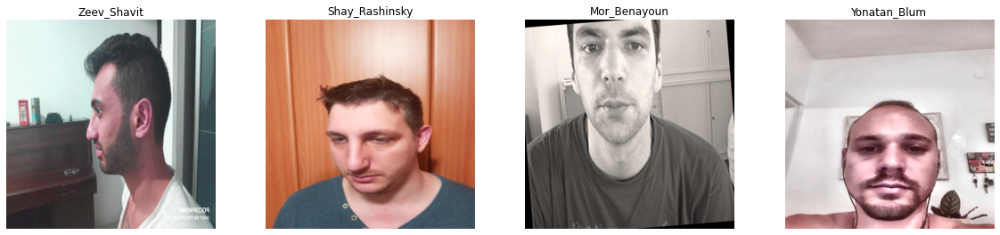

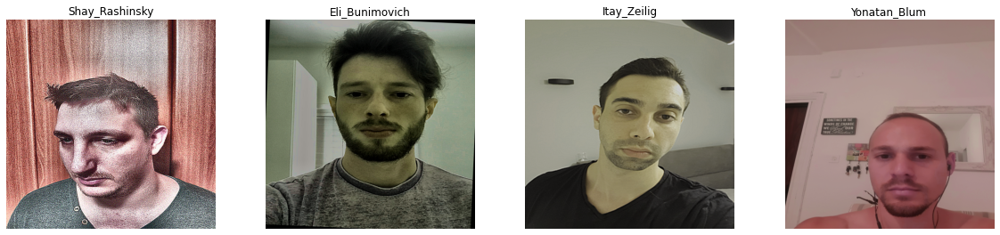

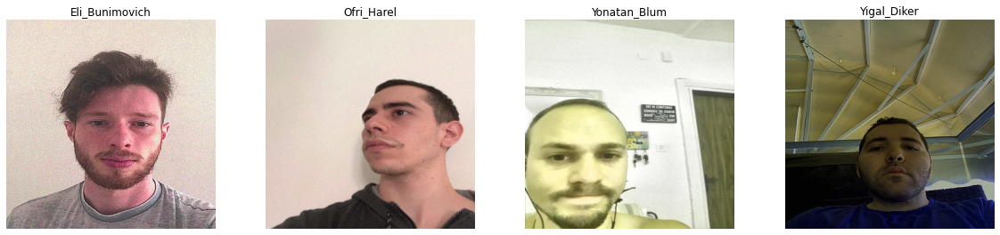

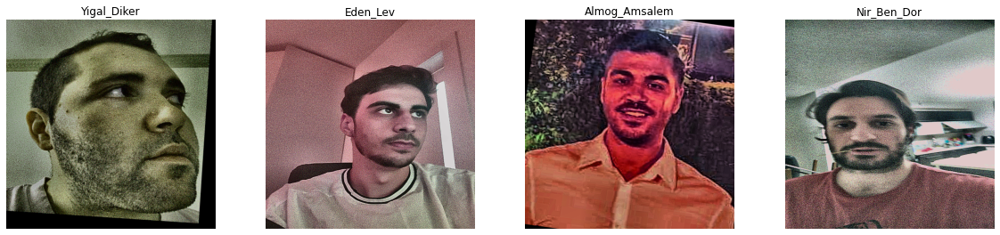

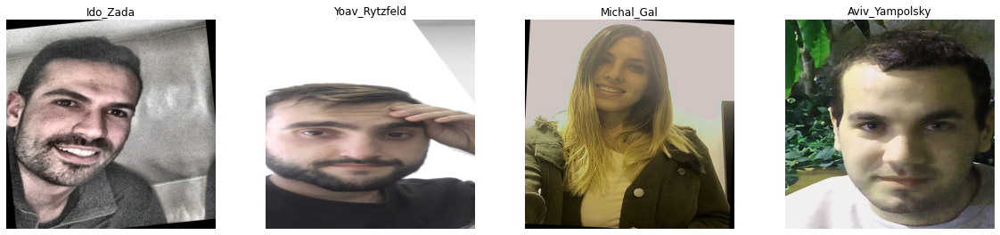

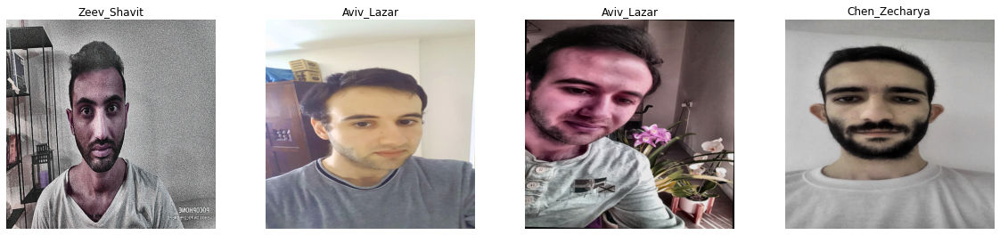

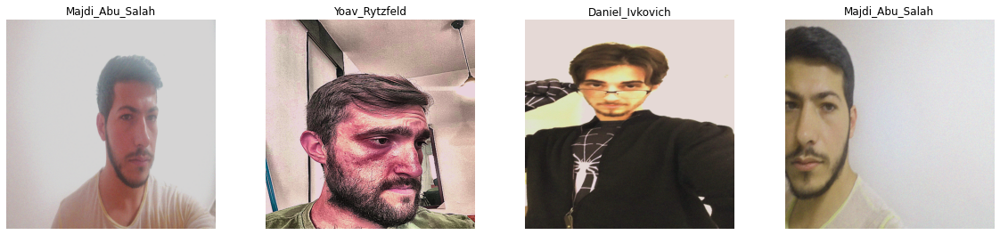

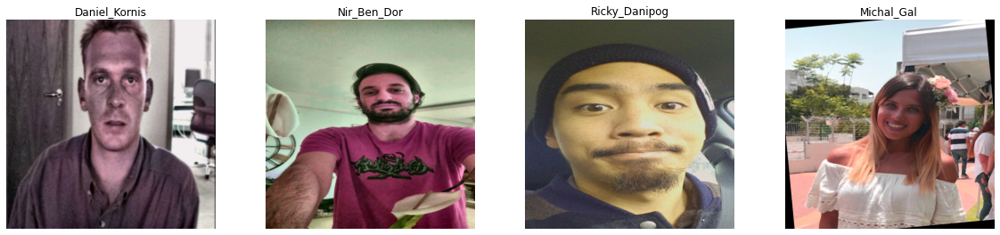

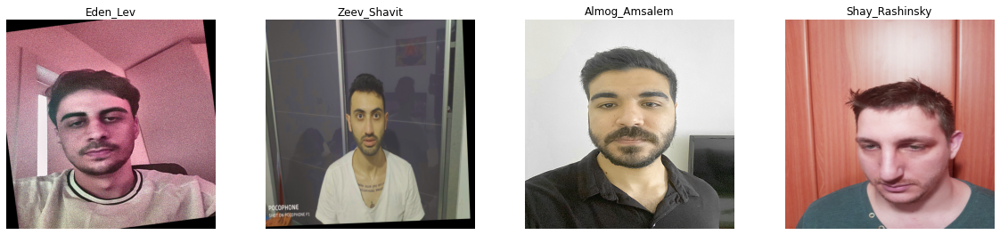

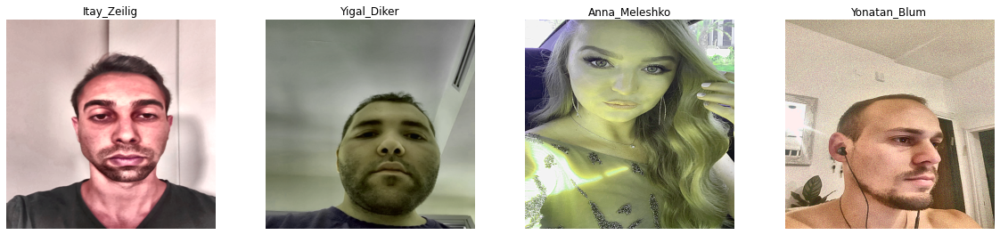

In [0]:
for i, (images, names, labels) in enumerate(train_loader):
      if i < 10:
        np_images = images.numpy()
        show_images_aug(np_images, names, 4, 5)
      else:
        break

# image before aug
תחילה אני מציגה איך התמונה המקורית נראית לפני כל שינויי אוגמנטציה שונים

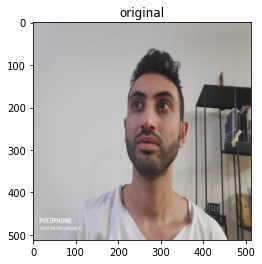

In [0]:
Sample_image_path=all_image[1]
 
image = cv2.imread(Sample_image_path)
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
image = cv2.resize(image, (512, 512), interpolation=cv2.INTER_AREA)
plt.title("original")
plt.imshow(image)

# augmentation report

כעת אני מציגה עבור כל אוגמנטציה  האם יכולים להיות לה ערכים שיהרסו את הדאטה ואם כן אילו

**augment_and_show**

 במתודה זו אני אוכל להציג עבור כל אוגמנטציה , איך התמונה נראית עם ערכים תקינים ואיך היא נראית עם ערכים לא תקינים

 אני מקבלת תמונה , אוגמנטציה עם ערכים טובים , אוכמנטציה עם ערכים לא טובים ,

 ואני מציגה את התמונה עם כל אחת מהאפשרויות

In [0]:
def augment_and_show(good_aug,bad_aug,images):
  image=images.copy()
  compose_bad = Compose([bad_aug], p=1)  
  compose_good = Compose([good_aug], p=1)  
  image_good = compose_good(image=image, label='label')['image']  
  image_bad = compose_bad(image=image, label='label')['image']  
  show_images_aug([image_good,image_bad], ["good","bad"], 2, 1)

### **HueSaturationValue**
אוגמנטציה זו משנה את הגוון, הרוויה והערך של התמונה.

כלומר אוגמנטציה זו נותנת מדמה תנאי אור שונים

ערכים גדולים מדי יכולים להרוס את התמונה ולהרוס את הצבעים לחלוטים , כך שיהיה קשה להבדיל בין הפיקסלים השונים שבתמונה 

זה עוזר לרשת לא לטעות כאשר התמונה מגיעה בתנאי אור שונים

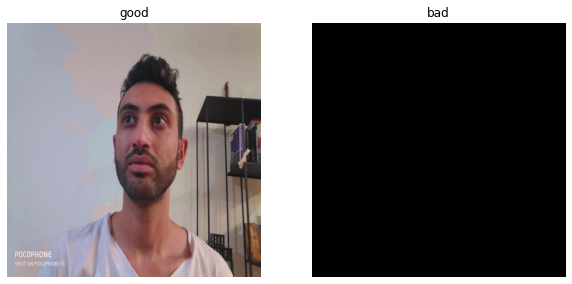

In [0]:
aug_good = HueSaturationValue(hue_shift_limit=20, sat_shift_limit=30, val_shift_limit=30, p=1)
aug_bad = HueSaturationValue(hue_shift_limit=255, sat_shift_limit=0, val_shift_limit=255, p=1)
augment_and_show(aug_good,aug_bad, image)

### HorizontalFlip
אוגמנטציה זו הופכת את התמונה אופקית

כלומר אוגמנטציה זו מדמה תמונה כאשר היא מסובבבת 

אוכגמנטציה זו לא הורסת את הדאטה  

אוגמנטציה זו עוזרת לרשת לא לטעות כאשר מגיעה תמונה עם פרצופים הפוכים
 

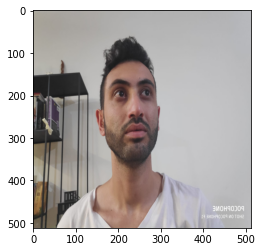

In [0]:
aug=HorizontalFlip(p=1)
image=aug(image=image)['image']
plt.imshow(image)

### ShiftScaleRotate

אוגמנטציה זו יכולה לעשות: הסטה, שינוי גודל וסיבוב תמונה  בזוויות שונות

זה עוזר לרשת לא לטעות כאשר התמונה מגיעה מסובבת או מוסטת בזוויות הטעיה שונות

ערכים גדולים מדי ב :

shift_limit ו- scale_limit 

יכולים להרוס לנו את התמונה

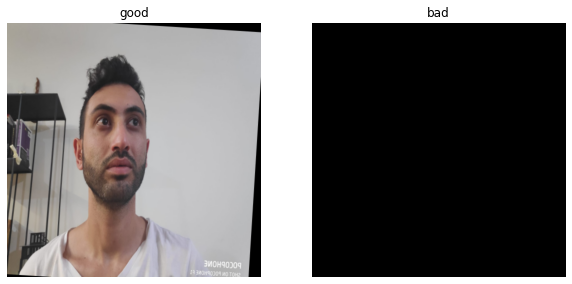

In [0]:
aug_good = ShiftScaleRotate(rotate_limit=15, border_mode=cv2.BORDER_CONSTANT, p=1)
aug_bad = ShiftScaleRotate(shift_limit=150, scale_limit=150, border_mode=cv2.BORDER_CONSTANT, p=1)
augment_and_show(aug_good,aug_bad, image)

### Rotate

אוגמנטציה זו מסובבת לנו את התמונה

זה עוזר לרשת לא לטעות כאר התמונה מגיעה בהטעיות שונות

ערכים גדולים מדי יגרמו לתמונה להתפך,
זה לא פוגע בתמונה שלנו

אבל בגלל שכל התמונות בדאטה לא מגיעות הפוכות ,אז ערכים גדולים מדי יכולים להשפיע לרעה על יכולת הלמידה של הרשת , ולכן לא שנתמש בערכים גדולים מדי

נשים לב :
עבור

border_mode

יש 2 אפשריות : או גבולות שחורים או גבולות שעשוייים מפקסלים של התמונה 

במידה והוא יקח פיקסלים מהפנים זה יכול להשפיע לרעה על יכולת הלמידה 



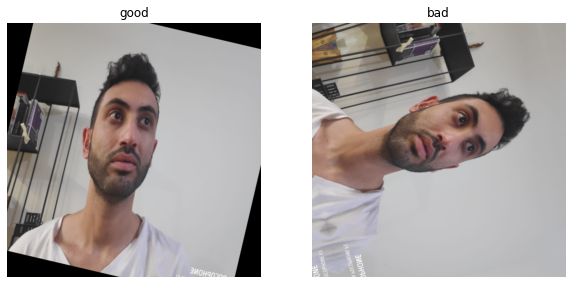

In [0]:
aug_good = Rotate(limit=30, border_mode=cv2.BORDER_CONSTANT, p=1)
aug_bad = Rotate(limit=180, p=1)
augment_and_show(aug_good,aug_bad, image)

### MedianBlur

אוגמנטציה זו מטשטשת את התמונה בצורה של  
MedianBlur


זה עוזר לרשת לא לטעות כאשר התמונה מגיעה מטושטשת 

ערכים גדולים מדי עלולים לטשטשט יותר מדי את התמונה עד כדי כך שלא נזהה את הפרצוף

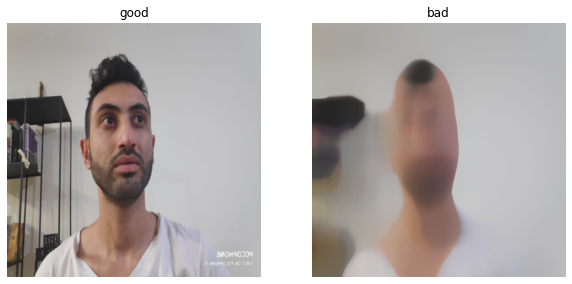

In [0]:
aug_good = MedianBlur(blur_limit=3, p=1)
aug_bad = MedianBlur(blur_limit=200,  p=1)
augment_and_show(aug_good,aug_bad, image)

### MotionBlur

אוגמנטציה זו מטשטשת את התמונה בצורה של טשטוש שנובע מאובייקט שזז

זה עוזר לרשת לא לטעות כאשר התמונה מגיעה מטושטשת

ערכים גדולים מדי עלולים לטשטשט יותר מדי את התמונה עד כדי כך שלא נזהה את הפרצוף

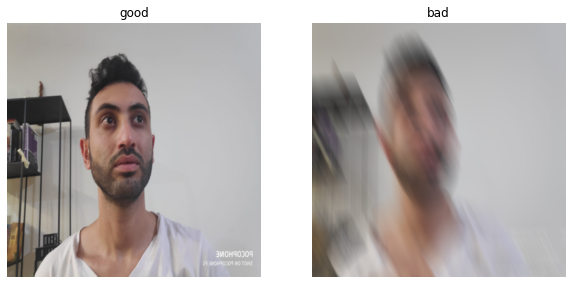

In [0]:
aug_good = MotionBlur(blur_limit=3, p=1)
aug_bad = MotionBlur(blur_limit=200,  p=1)
augment_and_show(aug_good,aug_bad, image)

### Blur

אוגמנטציה זו מטשטשת את התמונה 

זה עוזר לרשת לא לטעות כאשר התמונה מגיעה מטושטשת 

ערכים גדולים מדי עלולים לטשטשט יותר מדי את התמונה עד כדי כך שלא נזהה את הפרצוף

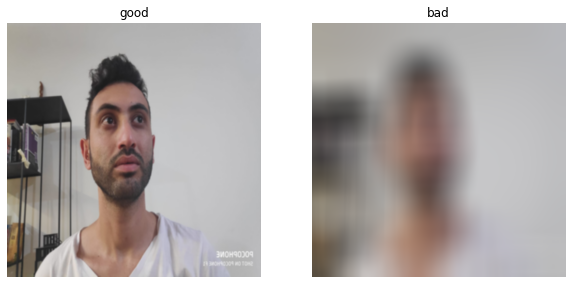

In [0]:
aug_good = Blur(blur_limit=3, p=1)
aug_bad = Blur(blur_limit=200,  p=1)
augment_and_show(aug_good,aug_bad, image)

### RandomBrightnessContrast

אוגמנטציה זו משנה את הבהירות והניגודיות של התמונה בצורה רנדומלית 
מדמה תנאי אור שונים  ובכך עוזר לרשת לא לטעות כאשר התמונה מגיאה בתנאי אור שונין

ערכים גדולים מדי עלוללים לשנות את ערכי הצבהים כך שהתמונה תהרס ממש  כמו למשל לגרום לשחור מוחלט או ללבן מולחט


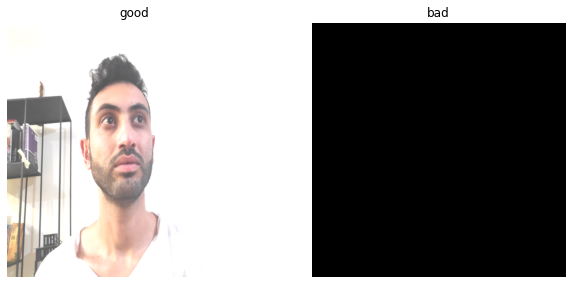

In [0]:
aug_good = RandomBrightnessContrast(brightness_limit=0.3, contrast_limit=0.3, p=1)
aug_bad = RandomBrightnessContrast(brightness_limit=12, contrast_limit=12, p=1)
augment_and_show(aug_good,aug_bad, image)

## RandomGamma

אוגמנטציה זו משנה את הגמא של התמונה.
כלומר היא מדמה  תנאי אור שונים.
ובכך עוזר לרשת שלא להטעות בתנאי אור.
ערכים נמוכים מדי ב- gamma_limit יהרסו את התמונה ותהפוך אותה לכהה מדי.

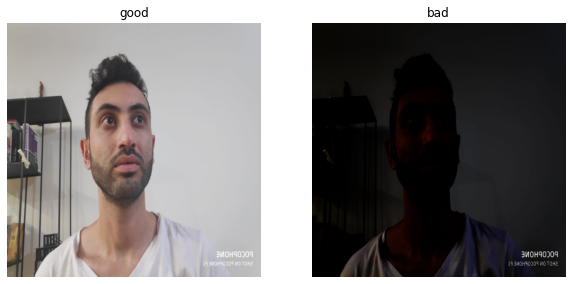

In [0]:
aug_good = RandomGamma(gamma_limit=(90, 120), p=1)
aug_bad = RandomGamma(gamma_limit=(10, 40), p=1)
augment_and_show(aug_good,aug_bad, image)

### GaussNoise
אוגמנטציה זו מוסיפה רעש לתמונה  
היא עוזרת לרשת לא לטעות כאשר התמונה מגיעה עם רעש

ערכישם גדולים מדי עלולים להוסיך מלא רעש כך שיהיה קשה לזהות את הקלט

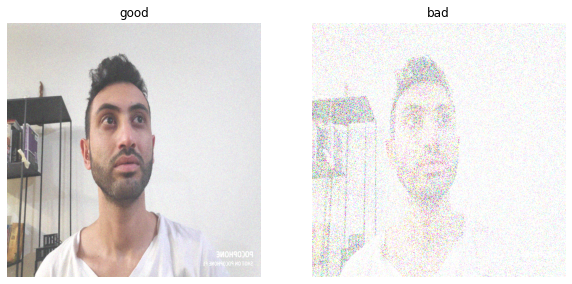

In [0]:
aug_good = GaussNoise(var_limit=(10.0, 80.0), p=1)
aug_bad = GaussNoise(var_limit=(1000.0, 2000.0), p=1)
augment_and_show(aug_good,aug_bad, image)

### CLAHE

אוגמנטציה זו מוסיפה ניגודיות
אוכמנטציה זו מדמה שמגיעה במגיעה עם הגדרות ניגודיות שונות ובכך עוזרת לרשת להתאמן על על דאטה שמגיע עם ניגודיות

ערכים גדולים מדי עלולים לגרום לתמונה  להיראות כמו תבליט או כמו קריטורטיה ובכך להרוס את האימון

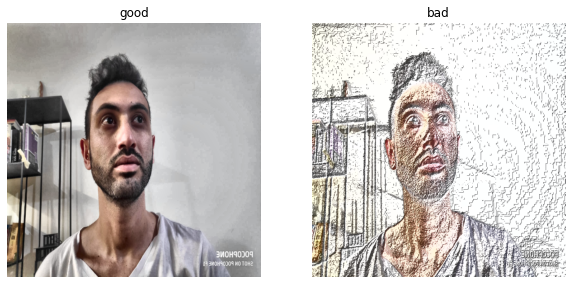

In [0]:
aug_good = CLAHE(clip_limit=5, p=1)
aug_bad = CLAHE(clip_limit=500, tile_grid_size=(2000,2000), p=1)
augment_and_show(aug_good,aug_bad, image)

### IAASharpen

תמונה זה מחדדת את ערכי הצבעים 
אוגמנטציה זו מדמה תמונה שמגיעה עם תנאי אור שונים
אוגמנטציה זו עוזרת לרשת להתאמן על דאטה שמגיע בתנאי אור שונים
ערכים גדולים מדי יהרסו את התמונה.

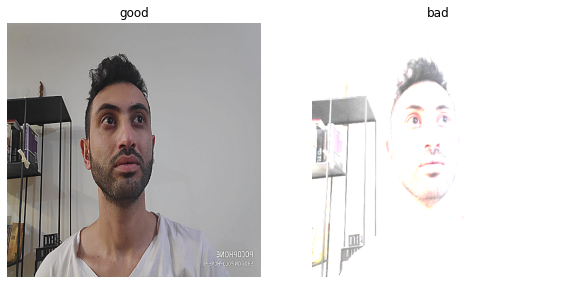

In [0]:
aug_good = IAASharpen(alpha=(0.2, 0.5), lightness=(0.5, 1.0), p=1)
aug_bad = IAASharpen(alpha=(0.2, 0.5), lightness=(15.0, 20.0), p=1)
augment_and_show(aug_good,aug_bad, image)

## **part 2**  Face Transfer

אני הורדתי מודל מתוך 

OPENCV 

ובעזרת הפונקציה

recognize_face

יצרתי מלבן שמסמן את מיקום הפרצוף




In [0]:
# SOURCE = "https://towardsdatascience.com/face-detection-in-2-minutes-using-opencv-python-90f89d7c0f81"
def recognize_face(img_path):
    # Load the cascade
    face_cascade = cv2.CascadeClassifier('haarcascade_frontalface_default.xml')
    # read image from path
    img = cv2.imread(img_path)
    img = cv2.resize(img, (512, 512), interpolation=cv2.INTER_AREA)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    # Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    # print(gray)
    plt.imshow(gray)
    # Detect the faces
    faces = face_cascade.detectMultiScale(gray, 1.1, 4)
    # Draw the rectangle around each face
    for (x, y, w, h) in faces:
        cv2.rectangle(img, (x, y), (x+w, y+h), (255, 0, 0), 2)
    # Display
    plt.imshow(img)


נדגים את פעולת המתודה 

hello


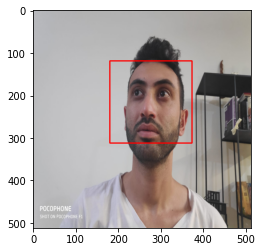

In [0]:
show_face_boundingbox(Sample_image_path)
# Sample_image_path

מתודה שחותכת את תיבת הפנים ומחזירה לנו אותה

In [0]:
def get_face_box(img):
    # img= cv2.resize(img, (512, 512), interpolation=cv2.INTER_AREA)
    # Load the cascade
    face_cascade = cv2.CascadeClassifier('haarcascade_frontalface_default.xml')
    # Convert to grayscale
    gray_img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    # Detect the faces
    return face_cascade.detectMultiScale(gray_img, 1.1, 4)

//this method fix the name of the users

In [0]:
def add_lable(path1,path2):
  name_list1 = path1.split('/')[-2].replace('_', ' ')
  name_list2 = path2.split('/')[-2].replace('_', ' ')

  name1=""+name_list1+" and " +name_list2
  name2=""+name_list2+" and " +name_list1

  return name1,name2



this method change the face between 2 users

In [0]:
def change_face(path1, path2, blur=0.8):
  # lable
  name1,name2=add_lable(path1,path2)
  
  img1=cv2.imread(path1)
  img2=cv2.imread(path2)
  img1= cv2.resize(img1, (512, 512), interpolation=cv2.INTER_AREA)
  img2= cv2.resize(img2, (512, 512), interpolation=cv2.INTER_AREA)

  # get face box
  faces1 = get_face_box(img1)
  faces2 = get_face_box(img2)
  rgbimg1 = cv2.cvtColor(img1, cv2.COLOR_BGR2RGB)
  rgbimg2 = cv2.cvtColor(img2, cv2.COLOR_BGR2RGB)

  #cropped the face box from each image
  (x1, y1, w1, h1) = faces1[0]
  cropped1 =  rgbimg1[y1:y1+h1, x1:x1+w1]
  (x2, y2, w2, h2) = faces2[0]
  cropped2 = rgbimg2[y2:y2+h2, x2:x2+w2]
  #resize the box face
  resize1=cv2.resize(cropped1, (h2, w2) ,interpolation=cv2.INTER_AREA)
  resize2=cv2.resize(cropped2, (h1, w1), interpolation=cv2.INTER_AREA)
  #blur the box face
  blur_face1 = cv2.addWeighted(cropped2, 1-blur, resize1, blur, 0)
  blur_face2 = cv2.addWeighted(cropped1, 1-blur, resize2, blur, 0)

  #united face and image
  rgbimg1[y1:y1+h1, x1:x1+w1]=blur_face2
  rgbimg2[y2:y2+h2, x2:x2+w2]=blur_face1

  show_images_aug([rgbimg1,rgbimg2],[name1,name2],2,1)




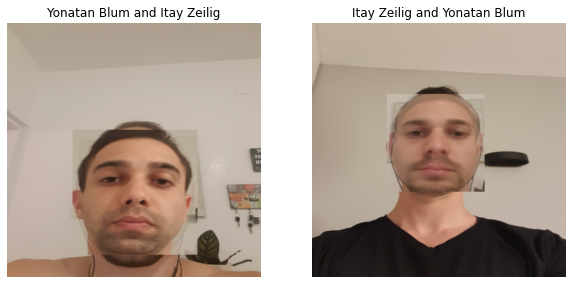

In [0]:
Sample_image_path2=all_image[100]
Sample_image_path1=all_image[40]
change_face(Sample_image_path1,Sample_image_path2, blur=0.8)




# אני אסביר למה בחרתי את הערך טשטוש 0.8



0.1 # לא שמים לב לשינוי 

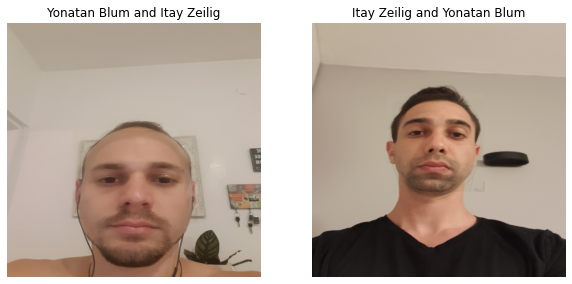

In [0]:

change_face(Sample_image_path1,Sample_image_path2, blur=0.1)


0.3 # בקושי שמים לב לשינוי

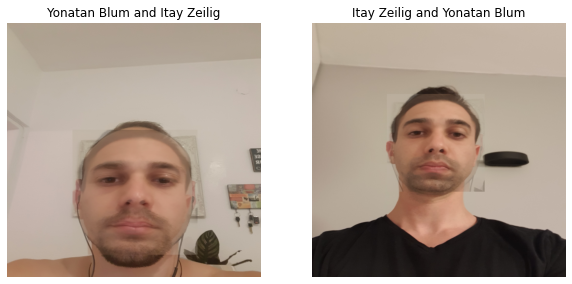

In [0]:
change_face(Sample_image_path1,Sample_image_path2, blur=0.3)

0.5 #  הטשטוש גורם לבלגן בעיינים ולא נעים להסתכל

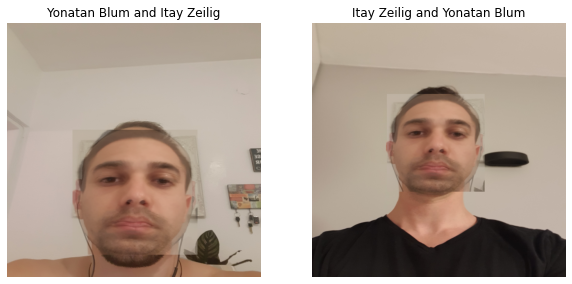

In [0]:

change_face(Sample_image_path1,Sample_image_path2, blur=0.5)

0.7 #  השינוי עדיין גורם לבלגן בעיניים אומנם הרבה פחות

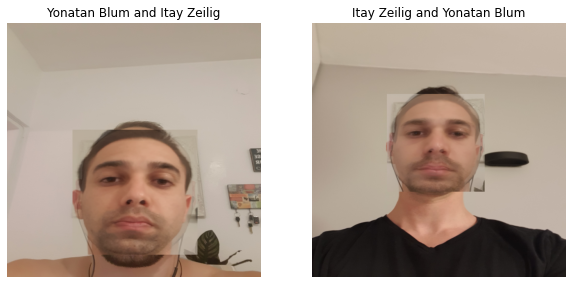

In [0]:
change_face(Sample_image_path1,Sample_image_path2, blur=0.7)

0.9 כבר # בקושי שמים לב לטשטוש

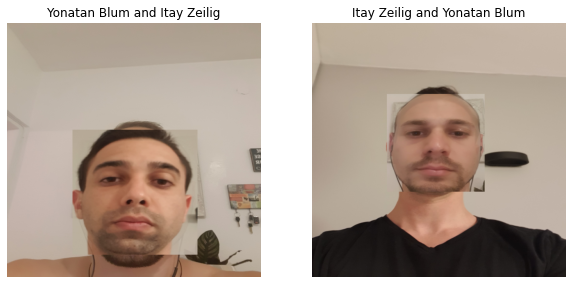

In [0]:
change_face(Sample_image_path1,Sample_image_path2, blur=0.9)

#  לכן הערך 0.8 ניראלי אידאילי

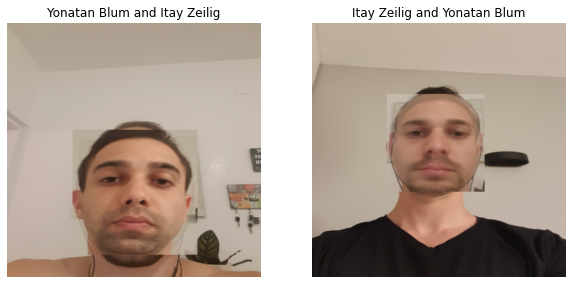

In [0]:
change_face(Sample_image_path1,Sample_image_path2, blur=0.8)

## part 3

שים לב לאורך כל ההגשה מצוריפים הסברים מפורטים בהקדמות לפונקציות 
 כעת אצרף הסברים נוספים שלא נאמרו

בחלק הראשון של התרגיל התבקשו ליצור 
 loader_data  
 שטוען את הדאטה מהדיסק ולא מהזיכרון, 
 תחילה ניגשתי לנסתיב של כל התמונות ששמורות בגוגל דרייב , וראיתי שעבור כל סטודנט יש תיקייה משלו ובכל תיקייה יש את התמונונת שלנו

 תחילה איחדתי את כל הנתיביבם של התמונות לליסט גדול אחד 
לאחר מכן חילקתי את הדאטה שהליסט הזה מכיל ליחס של שמונים אחוז אימון ועשרים אחוז טסט


היינו צריכים להציג את את כל הסטודנטים , תמונה מייצגת מכל סטודנט , אז השתמשתי בליסט  שמורכב מליסט בתוך ליסט , כל ערך בתא של ליסט מכיל ליסט של כל התמונות של אותו אדם 
לכן בצורה רנדומלית בחרתי תמונה אחת מתוך הליסט בתוך ליסט כך שקיבלתי מכל סטודנט תמונה מייצגת שלו

הצגתי את התמונות המייצגות שנבחרו לדוגמא :

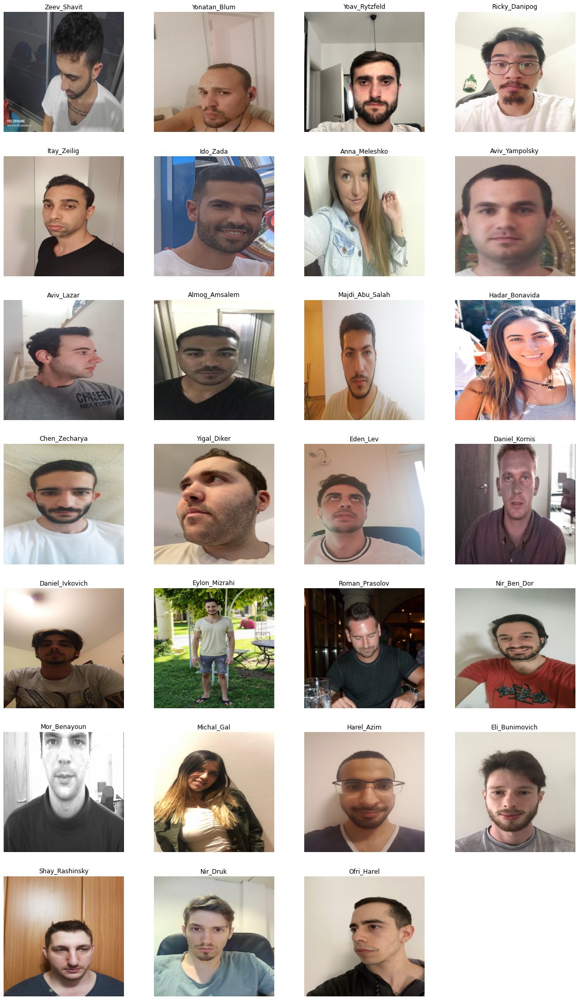

In [0]:
show_students_images(all_image_per_student, resize=True)

אחכ ביקשו מאיתנו להציג את התמונות לאחר האוגמנטציות , בניתי דאטה לואדר שמקבל את הנתיב הרצוי , טוען ומסדר את הדאטה ובמידה ונשלח אליו אימון אזי הוא מוסיף אוגמנטציות כך שלאחר האוגמנטציות הדאטה נראה כך:

ההסבר לבחירת האוגמנטציות ולבחירת  הערכים היה לאורך התרגיל

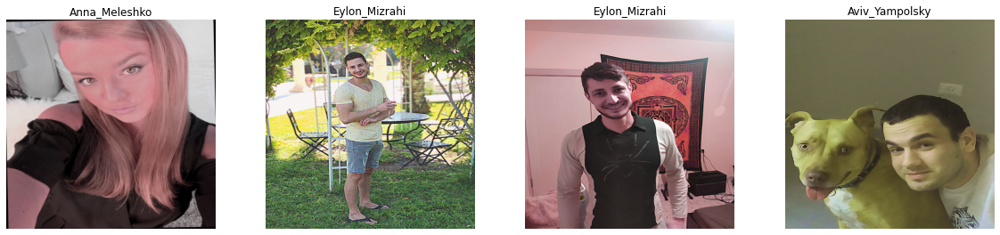

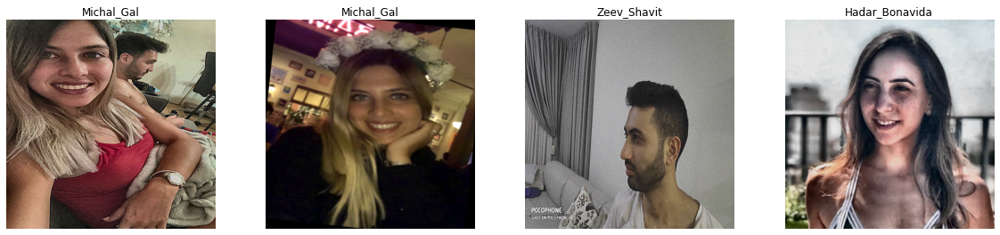

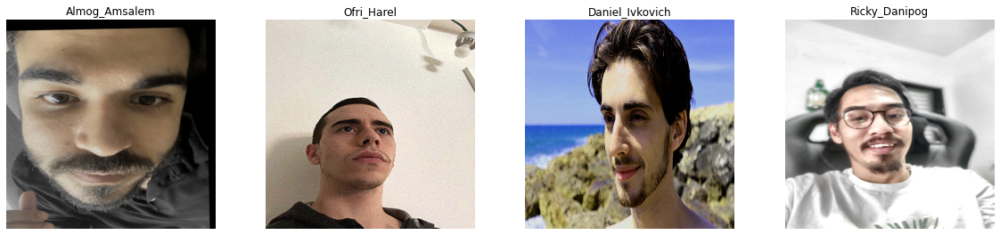

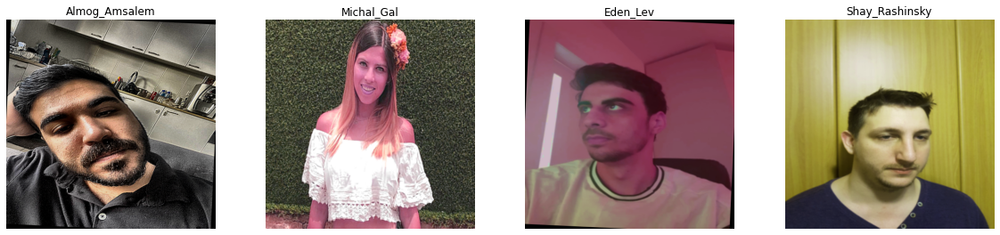

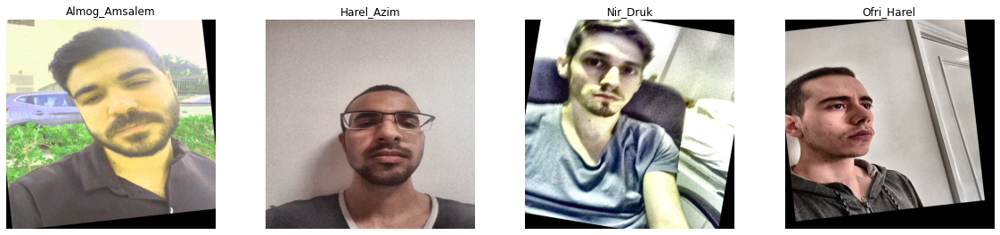

In [0]:
for i, (images, names, labels) in enumerate(train_loader):
      if i < 5:
        np_images = images.numpy()
        show_images_aug(np_images, names, 4, 5)
      else:
        break

הבדיקה עבור כל אוגמנטציה עם ערכים תקינים או ערכים לא תקינים נעשה על ידי הפונקציה

def augment_and_show(good_aug,bad_aug,images):

לדוגמא:


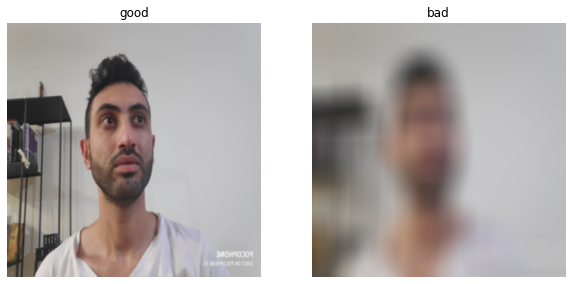

In [0]:
aug_good = Blur(blur_limit=3, p=1)
aug_bad = Blur(blur_limit=200,  p=1)
augment_and_show(aug_good,aug_bad, image)

בחלק השני הייתי צריכה תחילה לזהות את הפנים בתוך התמונה , נעזרתי בקוד ובמידע שמצאתי באינטרנט
המתודה קיבלה נתיב תמונה
הפכנו את הגוונים לאפור כי זה עובד רק כאשר התמונה נמצאתבגווני אפור , ואז נעזרתי בפונקציה

 faces = face_cascade.detectMultiScale(gray_img, 1.1, 4)

 לאחר מכן ציירנו ריבוע שמסמן בדיוק את הגבולות שקיבלנו
  
  לדוגמא:
  

hello


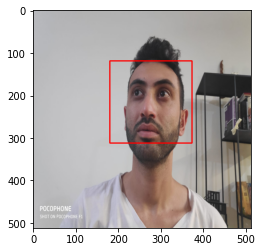

In [0]:
show_face_boundingbox(Sample_image_path)

בחלק הבא הייתי צריכה לקבל שני נתיבים שונים של פרצופים ולהחליף בין הפרצופים
תחילה טיפלתי בקטע של השמות ואיחדתי את השמות של 2 הפרצופים בצורה מתאימה

אחכ עבור כל נתיב תמונה שקיבלתי , הפכתי לתמונה , העברתי לאותו גודל תמונה את שניהם 
מצאתי את גבולות הפנים עבור כל תמונה  ואז חתכתי את הריבוע פנים 
שמרתי בזיכרון
ועבור כל פרצוף הדבקתי את התמונת פנים החתוכה של האדם השני

כדי לגרום לאיחוד התמונות להיות פחות בולט לעין הוספתי טשטוש  שיעזור בטושטוש הגבולות

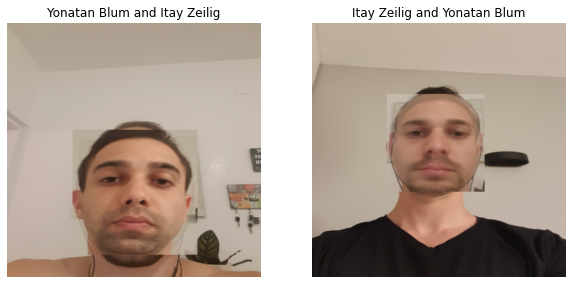

In [0]:
change_face(Sample_image_path1,Sample_image_path2, blur=0.8)